In [1]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google.colab'

In [25]:
import os
import shutil
import random

train_path = "/content/drive/MyDrive/face_mask_detection/face_data/train/images"
val_path = "/content/drive/MyDrive/face_mask_detection/face_data/val/images"
test_path = "/content/drive/MyDrive/face_mask_detection/face_data/test"

In [4]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5/
!pip install -r requirements.txt
!wget https://github.com/ultralytics/yolov5/releases/download/v6.0/yolov5s.pt


Cloning into 'yolov5'...
remote: Enumerating objects: 17067, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 17067 (delta 24), reused 28 (delta 12), pack-reused 17022 (from 1)
Receiving objects: 100% (17067/17067), 15.68 MiB | 15.22 MiB/s, done.
Resolving deltas: 100% (11719/11719), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.3/896.3 kB 22.0 MB/s eta 0:00:00
--2024-11-28 12:16:40--  https://github.com/ultralytics/yolov5/releases/download/v6.0/yolov5s.pt
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://objects.githubusercontent.com/github-production-release-asset-2e65be/264818686/eab38592-7168-4731-bdff-ad5ede2002be?X-Amz-Algorithm=AWS4-HMAC-SHA256&X-Amz-Credential=releaseassetproduction%2F20241128%2Fus-east-1%2Fs3%2Faws4_request&X-Amz-Date=20241128T121640Z&X

In [32]:
!python train.py --img 416 --batch 8 --epochs 50 --data /content/drive/MyDrive/face_mask_detection/data.yaml --weights /content/yolov5/yolov5s.pt --nosave --cache


A saída de streaming foi truncada nas últimas 5000 linhas.
  with torch.cuda.amp.autocast(amp):
      17/49      1.08G    0.04848   0.009888   0.003699         16        416:  22% 16/73 [00:02<00:08,  6.44it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      17/49      1.08G    0.04855   0.009453   0.004138          1        416:  23% 17/73 [00:02<00:08,  6.95it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      17/49      1.08G    0.04837   0.009141   0.003945          2        416:  25% 18/73 [00:03<00:07,  6.97it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocas

In [33]:

# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [40]:
!python detect.py --source /content/drive/MyDrive/face_mask_detection/face_data/test/ --weights /content/yolov5/runs/train/exp6/weights/last.pt --img 416 --save-txt --save-conf


detect: weights=['/content/yolov5/runs/train/exp6/weights/last.pt'], source=/content/drive/MyDrive/face_mask_detection/face_data/test/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-388-g882c35fc Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/29 /content/drive/MyDrive/face_mask_detection/face_data/test/173.jpg: 416x416 (no detections), 7.9ms
image 2/29 /content/drive/MyDrive/face_mask_detection/face_data/test/27.jpg: 416x416 (no detections), 8.0ms
WARNING ⚠️ NMS time limit 0.550s exceeded
i

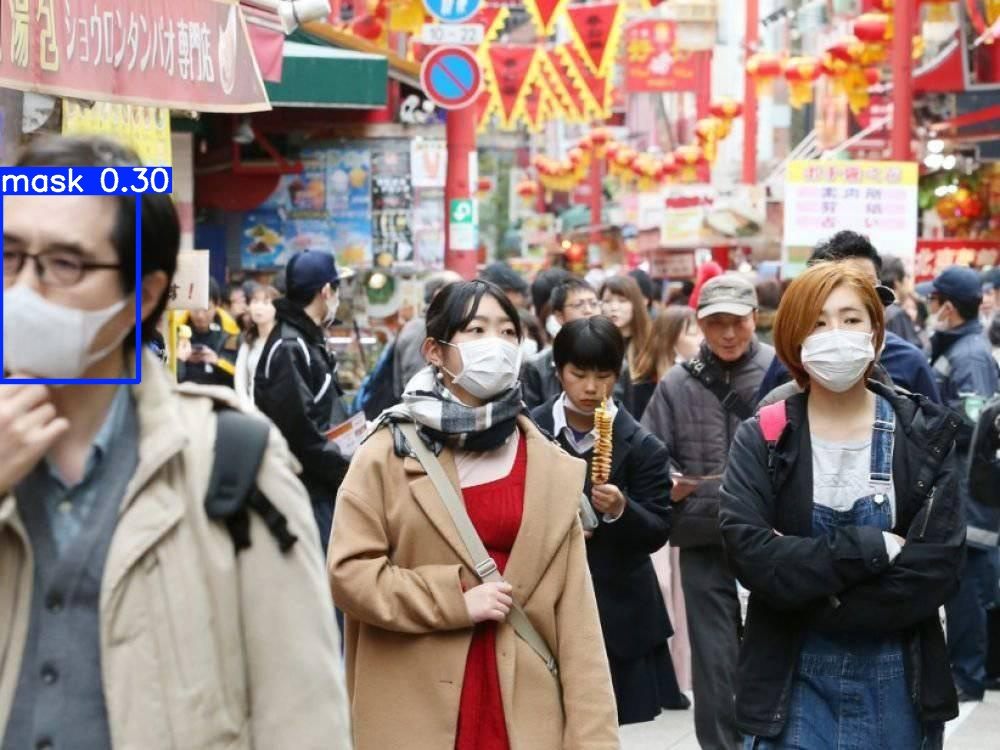

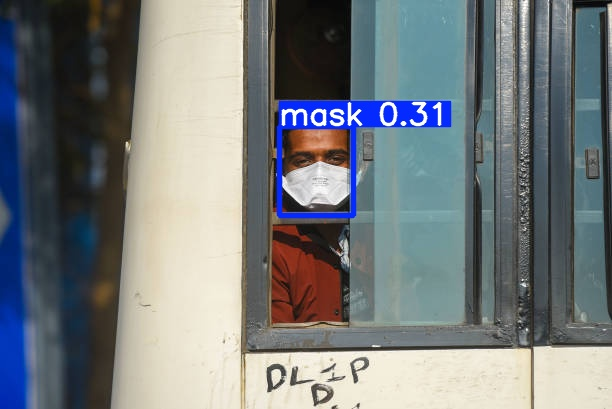

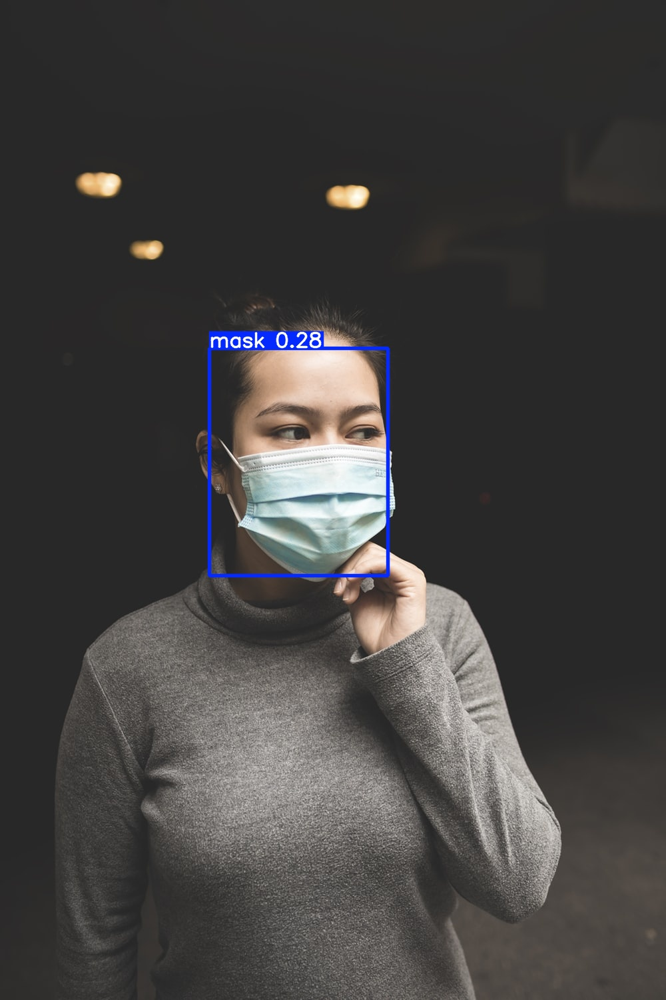

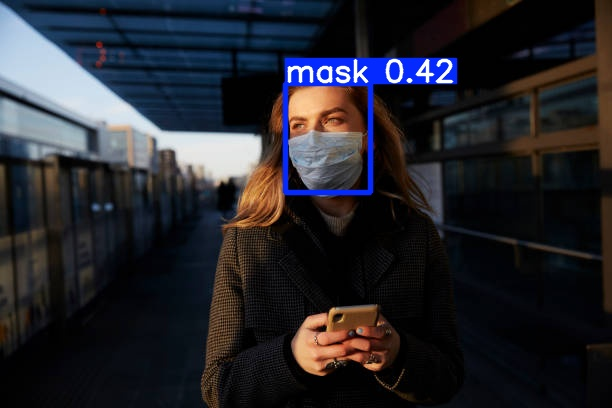

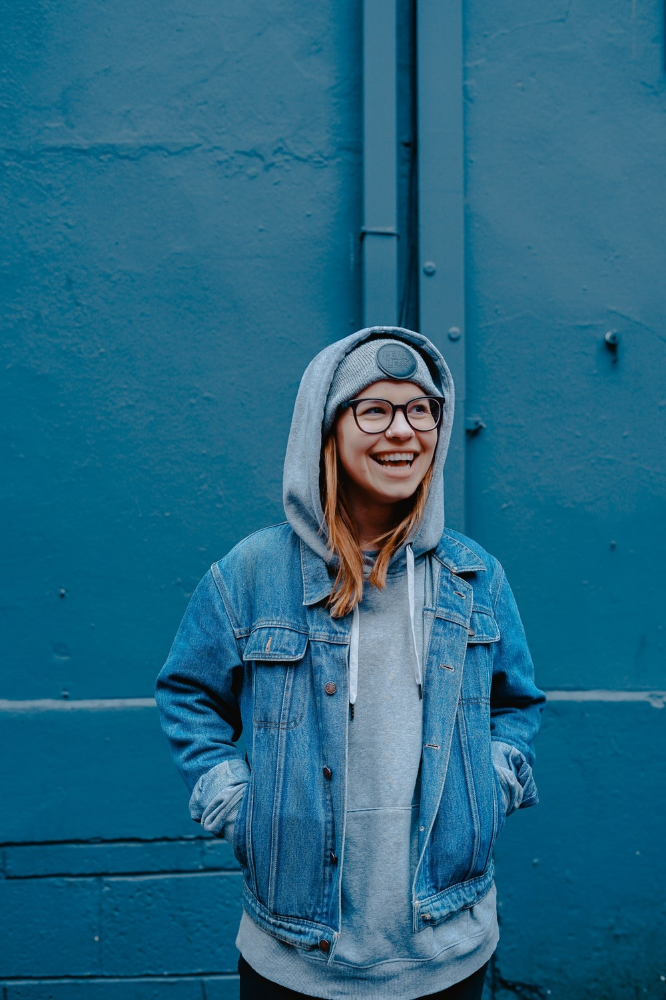

...

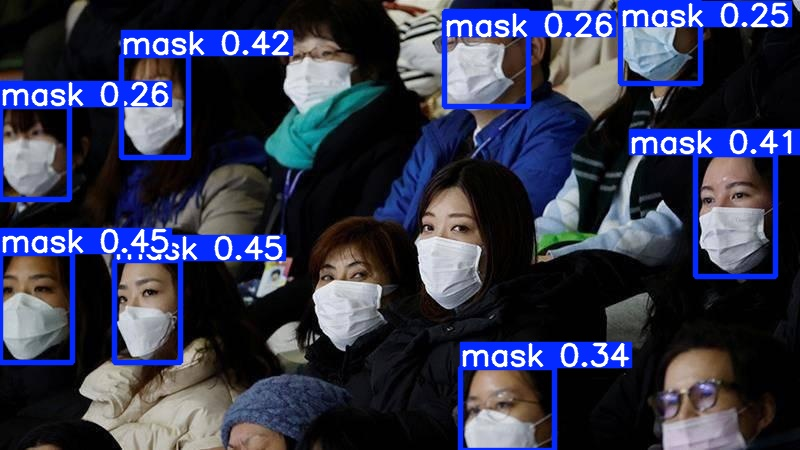

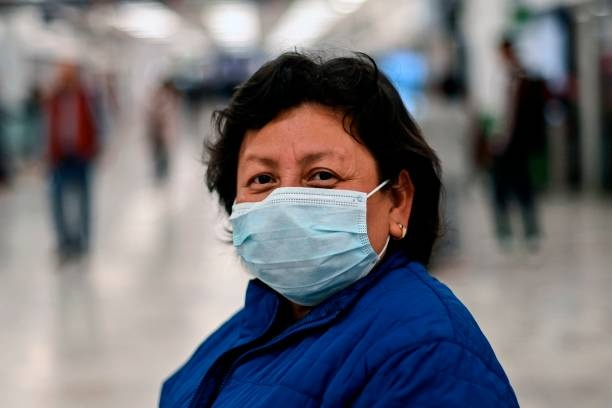

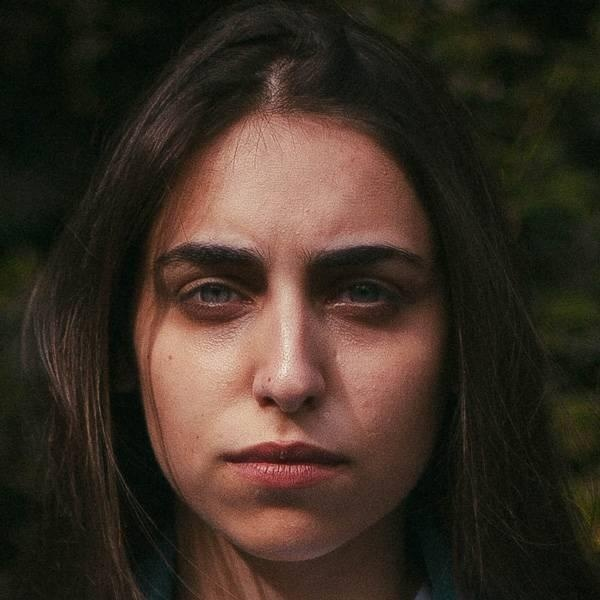

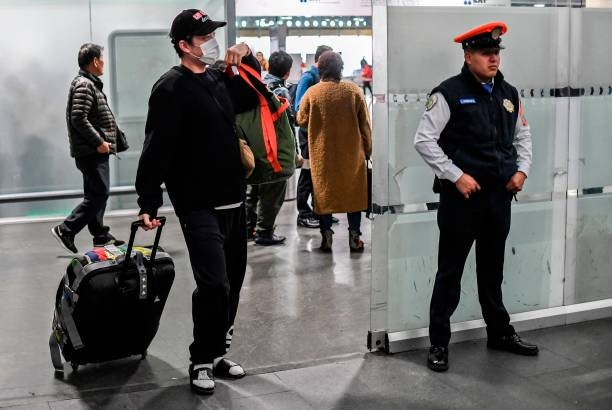

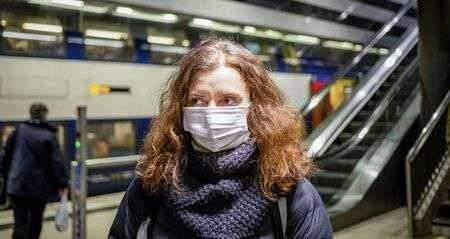

In [41]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp8/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")